<a href="https://colab.research.google.com/github/alexandrosnic/fastai_course/blob/main/course_2_fastai_deploy_an_ai_app.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1. Setup

In [1]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 KB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.8/462.8 KB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.0/213.0 KB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 KB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 41.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 7.2 MB/s eta 0:00:00
Mounted at /content/gdrive


In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *
import os


In [4]:
key = os.environ.get('AZURE_SEARCH_KEY', '5f2a8799a88d4595806fc0286d08918b')

In [5]:
search_images_bing

<function fastbook.search_images_bing(key, term, min_sz=128, max_images=150)>

In [6]:
results = search_images_bing(key, 'plants')
ims = results.attrgot('contentUrl')
len(ims)

150

#2 Download image data

In [8]:
plant_types = 'cactus','babboo','aloe vera'
path = Path('plants')

In [9]:
if not path.exists():
    path.mkdir()
    for o in plant_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} plant')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [10]:
img_files = get_image_files(path)
img_files

(#412) [Path('plants/cactus/85b5b40f-05db-4c85-b086-06f3cf580944.jpg'),Path('plants/cactus/f60da853-54a6-4f0f-83ad-75f0e3baa5d8.jpg'),Path('plants/cactus/ee16ce58-97d7-44c2-a360-40b4362f74af.jpg'),Path('plants/cactus/38d66db2-7322-4e1d-bd3b-d07cdca1f4ad.jpg'),Path('plants/cactus/0718edb9-d7d2-45f0-ad7f-40d77e67d929.jpg'),Path('plants/cactus/3a46d7b4-4330-44ee-adfa-6f32f23db01f.jpg'),Path('plants/cactus/8afb7621-619b-4ab2-9051-de4362f6061b.JPG'),Path('plants/cactus/70bf83ba-71d6-45a5-ac1e-8f979b9a3353.jpg'),Path('plants/cactus/486e2106-f725-42fa-a552-5c15fe9c3bdd.JPG'),Path('plants/cactus/0520d3d2-0681-4b8d-b583-8280503de873.jpeg')...]

In [11]:
failed = verify_images(img_files)
failed

(#10) [Path('plants/cactus/ee16ce58-97d7-44c2-a360-40b4362f74af.jpg'),Path('plants/cactus/0520d3d2-0681-4b8d-b583-8280503de873.jpeg'),Path('plants/cactus/28f548ae-1a73-4f13-90a7-4a8457490ece.jpg'),Path('plants/cactus/e0bb42a5-364d-4ec4-93d6-134c3c8ef355.jpg'),Path('plants/cactus/80da890e-d6a1-4b9c-a80c-a37fea402ca2.jpg'),Path('plants/cactus/a42cf98d-468d-4c4d-b72c-19b2a51c8c46.jpg'),Path('plants/cactus/78e3fbfe-b888-4c63-aed0-292becc664f2.jpg'),Path('plants/cactus/ce817a36-1854-4b62-ba68-d229dced6ac4.jpg'),Path('plants/aloe vera/90ce4e10-9629-4980-aff9-77d3d011403e.jpg'),Path('plants/babboo/b6deff81-0b67-4869-a158-21c3357ca0d0.jpg')]

In [12]:
failed.map(Path.unlink)


(#10) [None,None,None,None,None,None,None,None,None,None]

#3 Prepare the image datasets

In [13]:
plants = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=1),
    get_y=parent_label,
    item_tfms=Resize(128))

In [14]:
dls = plants.dataloaders(path)


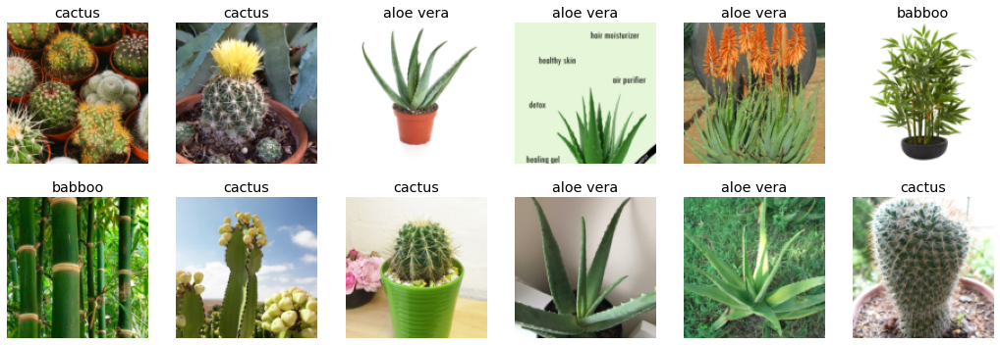

In [15]:
dls.valid.show_batch(max_n=12, nrows=2)


#Data Augmentation

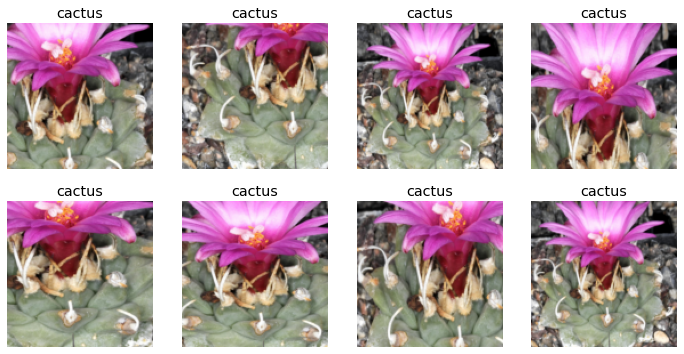

In [16]:
plants = plants.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = plants.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

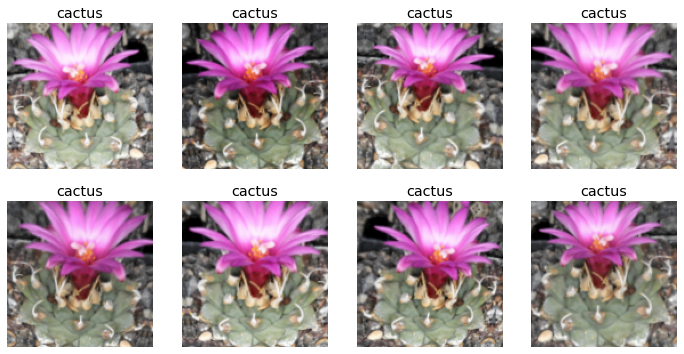

In [17]:
plants = plants.new(item_tfms=Resize(128), batch_tfms=aug_transforms())
dls = plants.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

#4. Train the model

In [18]:
plants = plants.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = plants.dataloaders(path)

In [19]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.8/dist-packages/fastai/vision/learner.py:288: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pt

  0%|          | 0.00/83.3M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.579859,0.752915,0.262500,02:31


epoch,train_loss,valid_loss,error_rate,time
0,0.679009,0.282973,0.087500,03:22
1,0.497333,0.132040,0.050000,03:18
2,0.387706,0.091153,0.050000,03:23
3,0.306954,0.080917,0.037500,03:19


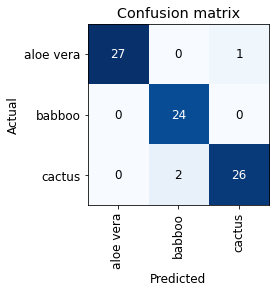

In [20]:
interpretation = ClassificationInterpretation.from_learner(learn)
interpretation.plot_confusion_matrix()

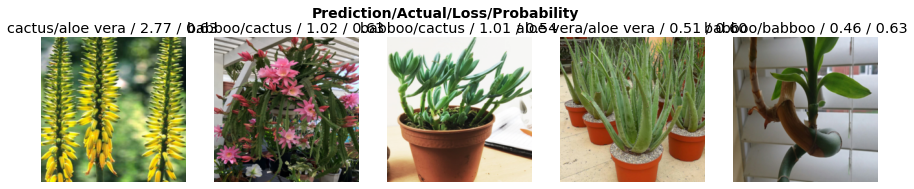

In [21]:
interpretation.plot_top_losses(5, nrows=1)


#5. Clean the Data

In [22]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [23]:
# Delete images marked as delete
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
    
# Update category of image to the newly specified category by moving it into the appropriate folder
for idx,cat in cleaner.change(): shutil.copyfile(cleaner.fns[idx], path/cat)

In [24]:
learn.export()


In [25]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

#6 - Using Image Classifier for Inference

In [26]:
learn_inf = load_learner(path/'export.pkl')


In [27]:
# Sample image
ims = ['https://th.bing.com/th/id/OIP.whMdqS5Cj-g32xLRVN6r7wHaFj?pid=ImgDet&rs=1']
dest = 'images/test_cactus.jpg'
download_url(ims[0], dest)

Path('images/test_cactus.jpg')

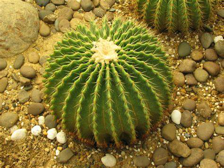

In [28]:
im = Image.open(dest)
im.to_thumb(224,224)

In [29]:
learn_inf.predict('images/test_cactus.jpg')


('cactus', TensorBase(2), TensorBase([1.7355e-05, 3.0568e-07, 9.9998e-01]))

In [30]:
learn_inf.dls.vocab


['aloe vera', 'babboo', 'cactus']

#7 - Create a classifier widget

In [31]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [38]:
# Retrieving the uploaded image
img = PILImage.create(btn_upload.data[-1])

In [39]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(224,224))
out_pl

Output()

In [40]:
pred,pred_idx,probs = learn_inf.predict(img)


In [41]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: cactus; Probability: 0.9997')

In [56]:
btn_run = widgets.Button(description='Classify Image')
btn_run

Button(description='Classify Image', style=ButtonStyle())

In [57]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [59]:
VBox([widgets.Label('Select the plant!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

#8 - Deployment as Web App

To publish your web app on Binder, you follow these steps:

1. Add your notebook to a [GitHub repository](http://github.com/).
2. Paste the URL of that repo into Binder's URL, as shown in <<deploy-binder>>.
3. Change the File dropdown to instead select URL.
4. In the "URL to open" field, enter `/voila/render/name.ipynb` (replacing `name` with the name of for your notebook).
5. Click the clickboard button at the bottom right to copy the URL and paste it somewhere safe. 
6. Click Launch.